# Assignment 1 - Simplified Custom Object Detection

This notebook contains the required task for the first assignment of the Deep Network Development course. Read the task description and fill in the empty code cells. Each section represents an implementation stage of object detection: -from `loading and inspecting the dataset`; -to `implementing`, `training and evaluating a Convolutional Neural Network based architecture`. The sections are there to guide you but you do not have to follow them strictly.

Copy this notebook to your drive (File -> Save a copy in Drive), edit it, and upload the final .ipynb file to [Canvas](https://canvas.elte.hu). If you are using this in Google Colab notebook, save it as .ipynb and upload it, or share the public link. If you have your own machine with Jupyter installed, you can work there as well, as long as you save and upload the .ipynb file.


## General Rules
Please check all the requirements listed on Canvas, but here are some general rules:
- Please select at least ANY 3 objects of choice. Try to pick unique objects. You may pick more, but less than 3 is not acceptable and results in losing points;
- While we do not require a high performance model, we still expect you to have a model that performs better than "random guessing" (i.e. for 3 objects, mAP should be better than 33%);
- Copying others' code will make you fail the assignment automatically, resulting in a 0;
- Not submitting anything results in a 0;
- Submitting something, as long as it is not an empty notebook, might result in a 1;
- **Deadline is October 25th Friday 11:59 PM** (strict, no late submission)
- Feel free to add more code cells as needed. But don't put code into external Python files.
- Please add your name, Neptun ID, and task details below.

**Name: Mir Mohibullah Sazid**  
**Neptun ID: GVFPV8**

**Network: CustomModel** 

**Objects: car, bus, cat**

## Task description

**Your task** is to train your own custom object detection model and compare its performance with an existing object detection model (i.e., YOLO). For that, you need to generate a synthetic dataset to train your own custom model and fine-tune an existing one. This is a simplified version of object detection, where each image must only contain a single object.

- There is no expectation of high performance, but **your metrics should show results better than random guessing, and your loss must decrease throughout the epochs**.

- We expect you to visualize the key metrics such as precision, recall, F1-score, mAP (mean average precision), IoU (Intersection over Union), and localization loss, in addition to monitoring the overall loss and its reduction across training. Use plots and visualizations (e.g., matplotlib, seaborn) to display metrics, losses, and predictions.

- You should implement techniques to avoid overfitting, such as Early Stopping, and save the best-performing model during training.

- Additionally, you can use **WandB (Weights and Biases)** or **TensorBoard** to track and visualize training progress, monitor the model's performance, and log metrics over time.

`Good luck!`

**In order to get your grade for the assignment, you must defend it by answering questions during the designated practice time.**

## Guidelines
Please carefully read each cell of the notebook, as they contain guidelines to help you complete the assignments. While you don't have to follow them strictly, we believe that they provide enough help.

# 0. Necessary Imports
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [1]:
# ADD YOUR CODE HERE
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# 1. DATASET
**For this assignment you are free to pick any 3 objects of your choice.** Please avoid offensive, inappropriate or violent objects.

### 1.1. Load objects

**Please select 3 or more objects.** After selecting the objects, **remove the background, keeping only the object itself**. You can do this manually, online, or by using code (this step is not part of the assignment evaluation).

As an example, the following objects were chosen (with the background removed using the Segment Anything Model):

### 1.2. Load backgrounds

In order to train a custom object detection model, a dataset is needed. For this assignment, a synthetic dataset should be created by:

- **Inserting an object in a random position** on a background image.

**Therefore, collect a few background images from different locations** This can be done manually or via code.

It is recommended to use **icrawler** to automate the image collection process.


In [ ]:
!pip install icrawler

In [1]:
!mkdir background

In case of any errors, try using a different crawler. You can use one of the following options:

```python
from icrawler.builtin import BaiduImageCrawler, BingImageCrawler, GoogleImageCrawler


In [ ]:
from icrawler.builtin import GoogleImageCrawler

google_crawler = GoogleImageCrawler(
    parser_threads=2,
    downloader_threads=4,
    storage={'root_dir': 'background'}
)

for keyword in ['budapest', 'budapest parliament', 'buda castle', 'budapest st stephen basilica', 'budapest heroes square']:
    google_crawler.crawl(
        keyword=keyword, max_num=10, file_idx_offset='auto', min_size=(500, 500))

#Some images may return an error, but icrawler tries to find other images regardless

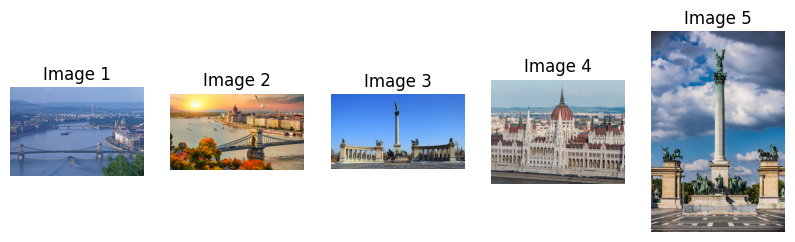

In [1]:

import os
from PIL import Image
import matplotlib.pyplot as plt

# Function to display a few images from the specified directory
def display_sample_images(directory, num_images=5):
    image_files = [f for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]
    selected_files = image_files[:num_images]  # Select a few images

    # Display the images using matplotlib
    plt.figure(figsize=(10, 5))
    for idx, image_file in enumerate(selected_files):
        img = Image.open(os.path.join(directory, image_file))
        plt.subplot(1, num_images, idx + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Image {idx + 1}")
    plt.show()

# Call the function to display sample images
display_sample_images('background', num_images=5)

### 1.3. Create dataset

### Dataset Creation

This is a crucial part of the assignment evaluation. From the selected objects and collected background images, follow these steps to generate your dataset:

1. **Randomly select background images** from your collection.
2. **Insert a single object** (from the three selected) into each background image at a **random location**.
3. **Record the object's coordinates** and create a corresponding bounding box. For example:
   - If an object with height `h` and width `w` is placed at position `(x, y)`, the bounding box should be in one of the following formats:
     - **[x, y, w, h]** or
     - **[x1, y1, x2, y2]**, where `x2 = x1 + w` and `y2 = y1 + h`.
4. If you plan to compare your custom model with a YOLO model, use the **YOLO bounding box format**:
   - `[(x + w/2)/image_width, (y + h/2)/image_height, w/image_width, h/image_height]`, where `image` refers to the background image dimensions.
5. **Save the generated dataset**, as it will be used for training your custom model and fine-tuning the existing object detection model.
6. **Wrap the dataset creation** in a **PyTorch Dataset class** for easier data handling and model training.
7. **Split the dataset** into training, validation, and test sets to evaluate your model effectively.


In [1]:
from PIL import Image

# Open the images
bus_img = Image.open("bus.png")
car_img = Image.open("car.png")
cat_img = Image.open("cat.png")

# Resize the images to 50x50 pixels
bus_img = bus_img.resize((250, 250))
car_img = car_img.resize((250, 250))
cat_img = cat_img.resize((250, 250))

# Save the resized images
bus_img.save("bus_img.png")
car_img.save("car_img.png")
cat_img.save("cat_img.png")


In [2]:
import os
import random
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# Define paths for background and object images
background_dir = "background"


objects = {
    "bus": "bus_img.png",  
    "car": "car_img.png",  
    "cat": "cat_img.png"
}
classes = list(objects.keys())

# Create a directory for saving synthetic images
def create_dataset(root_dir, dataset_name, split, num_images):
    synthetic_dir = os.path.join(root_dir, dataset_name, split)
    image_dir = os.path.join(synthetic_dir, 'images')
    label_dir = os.path.join(synthetic_dir, 'labels')
    os.makedirs(image_dir, exist_ok=True)
    os.makedirs(label_dir, exist_ok=True)

    def add_object_to_background(background, object_img):
        # Adding the objects to the background 

        
        if object_img.width > background.width or object_img.height > background.height:
            return None  # Skip this background

        # Get random position for placing the object on the background
        max_x = background.width - object_img.width
        max_y = background.height - object_img.height

        # If max_x or max_y are negative, skip placing the object
        if max_x < 0 or max_y < 0:
            return None  # Skip this background

        position = (random.randint(0, max_x), random.randint(0, max_y))

        # Paste the object onto the background using transparency (alpha channel)
        background.paste(object_img, position, object_img)
        return background, position, object_img.size

    for i in range(num_images):
        # Load a random background image
        background_file = random.choice([f for f in os.listdir(background_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
        background_path = os.path.join(background_dir, background_file)
        background = Image.open(background_path).convert("RGBA")

        # Select a random object
        random_object_name = random.choice(classes)
        object_path = objects[random_object_name]
        object_img = Image.open(object_path).convert("RGBA")  # Ensure alpha channel (transparency)

        # Add the selected object to the background 
        result = add_object_to_background(background, object_img)

        if result is None:
            print(f"Skipping background {background_file} as it's too small for the object.")
            continue  # Skip this background and continue with the next one

        synthetic_image, (x, y), (w, h) = result
        synthetic_image = synthetic_image.convert("RGB")  # Convert to RGB before saving

        # Save the image
        image_filename = f"{i:05d}.jpg"
        image_path = os.path.join(image_dir, image_filename)
        synthetic_image.save(image_path)

        # Calculate YOLO-format bounding box using the original background dimensions
        img_width, img_height = synthetic_image.width, synthetic_image.height
        yolo_x = (x + w / 2) / img_width
        yolo_y = (y + h / 2) / img_height
        yolo_w = w / img_width
        yolo_h = h / img_height
        class_index = classes.index(random_object_name)

        # Save the label in YOLO format
        label_path = os.path.join(label_dir, f"{i:05d}.txt")
        with open(label_path, "w") as f:
            f.write(f"{class_index} {yolo_x} {yolo_y} {yolo_w} {yolo_h}\n")

    print(f"Synthetic images and labels saved in: {synthetic_dir}")

# Create train, val, and test datasets 
create_dataset('dataset', 'custom_dataset', split='train', num_images=5000)
create_dataset('dataset', 'custom_dataset', split='val', num_images=1000)
create_dataset('dataset', 'custom_dataset', split='test', num_images=200)


Synthetic images and labels saved in: dataset/custom_dataset/train
Synthetic images and labels saved in: dataset/custom_dataset/val
Synthetic images and labels saved in: dataset/custom_dataset/test


In [2]:
import os
import random
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, split='train', num_classes=3, transform=None):
        self.root_dir = root_dir
        self.split_dir = os.path.join(root_dir, split)
        self.image_dir = os.path.join(self.split_dir, 'images')
        self.label_dir = os.path.join(self.split_dir, 'labels')
        self.image_filenames = sorted(os.listdir(self.image_dir))
        self.transform = transform
        self.num_classes = num_classes

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        # Load image
        img_name = self.image_filenames[idx]
        img_path = os.path.join(self.image_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        # Load label
        label_path = os.path.join(self.label_dir, img_name.replace('.jpg', '.txt'))
        with open(label_path, 'r') as f:
            label = f.readline().strip().split()
            category = int(label[0])
            bbox = [float(x) for x in label[1:]]

        # Apply transformation 
        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(category), torch.tensor(bbox)

# Set up dataset and data loaders
root_dir = 'dataset/custom_dataset'
transform = transforms.Compose([
    transforms.Resize((640, 640)),  # Resize all images to 640x640
    transforms.ToTensor(),  # Convert image to tensor
])

train_dataset = ObjectDetectionDataset(root_dir, split='train', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4, pin_memory=True)

val_dataset = ObjectDetectionDataset(root_dir, split='val', transform=transform)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=4, pin_memory=True)

test_dataset = ObjectDetectionDataset(root_dir, split='test', transform=transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=4, pin_memory=True)

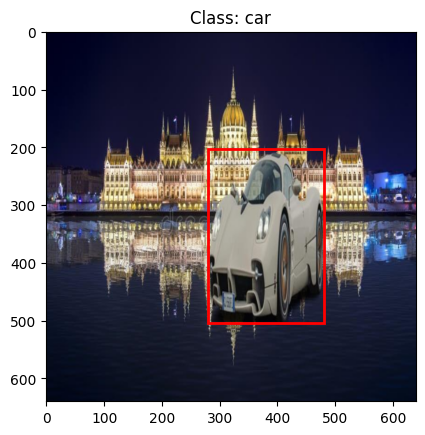

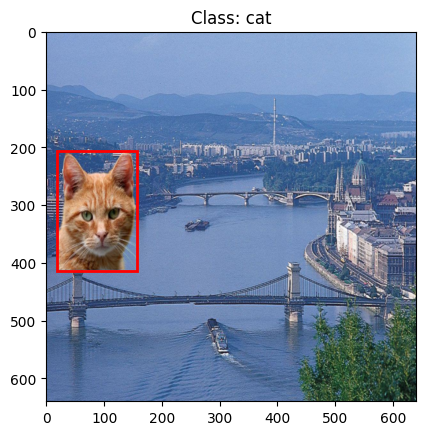

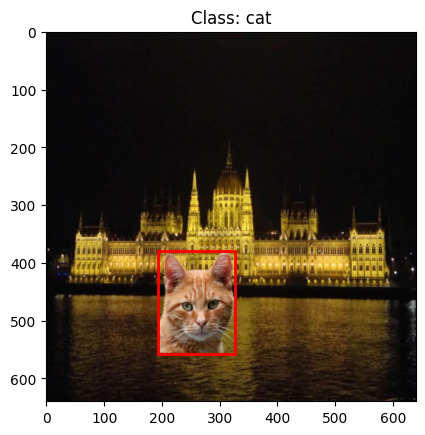

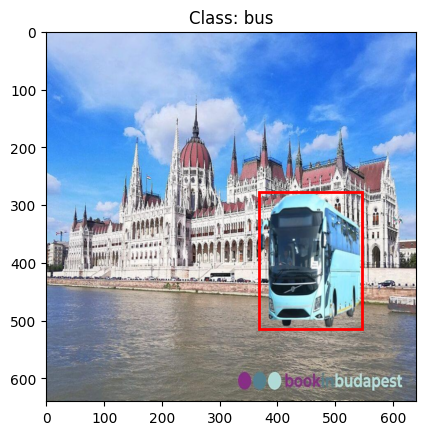

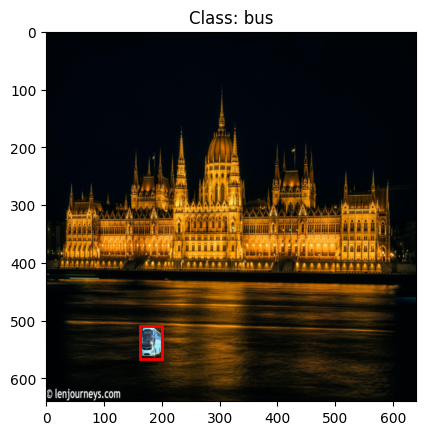

In [4]:
import matplotlib.pyplot as plt

def visualize_dataset(dataset, num_images=5):
    for i in range(num_images):
        image, category, bbox = dataset[i]
        image = image.permute(1, 2, 0).numpy()  
        plt.imshow(image)

        # Convert bbox from YOLO format back to coordinates for visualization
        img_height, img_width = image.shape[:2]
        x_center = bbox[0] * img_width
        y_center = bbox[1] * img_height
        box_width = bbox[2] * img_width
        box_height = bbox[3] * img_height

        x1 = x_center - box_width / 2
        y1 = y_center - box_height / 2
        x2 = x_center + box_width / 2
        y2 = y_center + box_height / 2

        plt.gca().add_patch(
            plt.Rectangle((x1, y1), box_width, box_height, edgecolor='red', facecolor='none', linewidth=2)
        )
        plt.title(f"Class: {classes[category]}")
        plt.show()

visualize_dataset(train_dataset)

### 2. MODELS

In this assignment, you are tasked with building your own custom object detection model and comparing its performance against an existing object detection model.


### 2.1. Custom Object Detection model

### Create a Convolutional Neural Network (CNN) Architecture

Design a CNN-based architecture that includes a **backbone for feature extraction** and two output branches:

- One for **class probabilities** (with output size equal to the number of object classes, e.g., 3).
- Another for **bounding box regression** (with size 4 for the box coordinates: x, y, w, h, or in your chosen format).

This is the core evaluation of the assignment. Experiment with different layers, hyperparameters, and regularization techniques to optimize the model's performance.


In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
torch.cuda.empty_cache()


In [3]:
import torch
import torch.nn as nn

class CustomModel(nn.Module):
    def __init__(self, num_classes=3):
        super(CustomModel, self).__init__()

        # Define custom backbone 
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(512, 1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(1024, 2048, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(2048),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # Classification branch with Dropout
        self.classifier = nn.Sequential(
            nn.Conv2d(2048, 1024, kernel_size=3, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
            nn.Flatten(),
            nn.Dropout(0.4),  # Add dropout for regularization
            nn.Linear(1024, num_classes)    # Linear layer to output class probabilities
        )

        # Bounding box regression branch aligned with backbone's final output
        self.bbox_regressor = nn.Sequential(
            nn.Conv2d(2048, 1024, kernel_size=3, padding=1),  # Use 2048 as input from backbone
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(1024, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
            nn.Flatten(),
            nn.Dropout(0.3),  # Add dropout for regularization
            nn.Linear(512, 256),           
            nn.ReLU(),
            nn.Linear(256, 128),           
            nn.ReLU(),
            nn.Linear(128, 4)              # Linear layer to output 4 bounding box coordinates
        )

    def forward(self, x):
        # Shared backbone
        features = self.backbone(x)

        # Classification branch
        class_output = self.classifier(features)

        # Bounding box regression branch
        bbox_output = self.bbox_regressor(features)

        return class_output, bbox_output


# Loss Functions
classification_loss_fn = nn.CrossEntropyLoss()  # For classification
bbox_loss_fn = nn.SmoothL1Loss()  # For bounding box regression





# Instantiate the model and pass a dummy image through it
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dummy_image = torch.randn(1, 3, 640, 640).to(device)  # Simulate a single image (batch size 1)
num_classes = 3

model = CustomModel(num_classes).to(device)
cls_output, bbox_output = model(dummy_image)



print("Class Output Shape:", cls_output.shape)  # Expected: [batch_size, num_classes]
print("Bounding Box Output Shape:", bbox_output.shape)  # Expected: [batch_size, 4]


Class Output Shape: torch.Size([1, 3])
Bounding Box Output Shape: torch.Size([1, 4])


### 2.2. Train Your Model

Carefully choose key components like the **optimizer**, **loss function**, **number of epochs**, and **regularization techniques**. Ensure you're optimizing both **classification loss** and **bounding box regression loss**.

Monitor for signs of **overfitting** or **underfitting** by tracking how the loss evolves across epochs. The loss should consistently decrease as training progresses. Save and log these losses for visualization and further analysis.


**Example Plot**:

<a href="https://ibb.co/bzmMxJY"><img src="https://i.ibb.co/t8KTSXn/download.png" alt="download" border="0"></a>

Training Epoch 1/30: 100%|██████████| 1250/1250 [03:44<00:00,  5.56it/s]


Model saved at epoch 1 with validation loss: 0.5381
Epoch [1/30], Train Class Loss: 0.8869, Train BBox Loss: 0.0131, Val Class Loss: 0.4644, Val BBox Loss: 0.0071


Training Epoch 2/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.61it/s]


Model saved at epoch 2 with validation loss: 0.0933
Epoch [2/30], Train Class Loss: 0.2360, Train BBox Loss: 0.0052, Val Class Loss: 0.0290, Val BBox Loss: 0.0024


Training Epoch 3/30: 100%|██████████| 1250/1250 [03:44<00:00,  5.58it/s]


Model saved at epoch 3 with validation loss: 0.0593
Epoch [3/30], Train Class Loss: 0.1120, Train BBox Loss: 0.0027, Val Class Loss: 0.0176, Val BBox Loss: 0.0016


Training Epoch 4/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.61it/s]


Model saved at epoch 4 with validation loss: 0.0462
Epoch [4/30], Train Class Loss: 0.0602, Train BBox Loss: 0.0021, Val Class Loss: 0.0130, Val BBox Loss: 0.0012


Training Epoch 5/30: 100%|██████████| 1250/1250 [03:46<00:00,  5.53it/s]


Early stopping counter: 1/5
Epoch [5/30], Train Class Loss: 0.0394, Train BBox Loss: 0.0015, Val Class Loss: 0.0393, Val BBox Loss: 0.0013


Training Epoch 6/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.62it/s]


Model saved at epoch 6 with validation loss: 0.0203
Epoch [6/30], Train Class Loss: 0.0335, Train BBox Loss: 0.0013, Val Class Loss: 0.0061, Val BBox Loss: 0.0005


Training Epoch 7/30: 100%|██████████| 1250/1250 [03:43<00:00,  5.59it/s]


Early stopping counter: 1/5
Epoch [7/30], Train Class Loss: 0.0205, Train BBox Loss: 0.0010, Val Class Loss: 0.0040, Val BBox Loss: 0.0007


Training Epoch 8/30: 100%|██████████| 1250/1250 [03:46<00:00,  5.51it/s]


Model saved at epoch 8 with validation loss: 0.0147
Epoch [8/30], Train Class Loss: 0.0147, Train BBox Loss: 0.0008, Val Class Loss: 0.0024, Val BBox Loss: 0.0004


Training Epoch 9/30: 100%|██████████| 1250/1250 [03:45<00:00,  5.55it/s]


Model saved at epoch 9 with validation loss: 0.0116
Epoch [9/30], Train Class Loss: 0.0007, Train BBox Loss: 0.0005, Val Class Loss: 0.0033, Val BBox Loss: 0.0003


Training Epoch 10/30: 100%|██████████| 1250/1250 [03:45<00:00,  5.54it/s]


Early stopping counter: 1/5
Epoch [10/30], Train Class Loss: 0.0404, Train BBox Loss: 0.0007, Val Class Loss: 0.0511, Val BBox Loss: 0.0015


Training Epoch 11/30: 100%|██████████| 1250/1250 [03:45<00:00,  5.53it/s]


Model saved at epoch 11 with validation loss: 0.0094
Epoch [11/30], Train Class Loss: 0.0070, Train BBox Loss: 0.0006, Val Class Loss: 0.0023, Val BBox Loss: 0.0003


Training Epoch 12/30: 100%|██████████| 1250/1250 [03:43<00:00,  5.58it/s]


Model saved at epoch 12 with validation loss: 0.0081
Epoch [12/30], Train Class Loss: 0.0005, Train BBox Loss: 0.0004, Val Class Loss: 0.0019, Val BBox Loss: 0.0002


Training Epoch 13/30: 100%|██████████| 1250/1250 [03:48<00:00,  5.48it/s]


Model saved at epoch 13 with validation loss: 0.0056
Epoch [13/30], Train Class Loss: 0.0003, Train BBox Loss: 0.0003, Val Class Loss: 0.0013, Val BBox Loss: 0.0002


Training Epoch 14/30: 100%|██████████| 1250/1250 [03:41<00:00,  5.65it/s]


Model saved at epoch 14 with validation loss: 0.0054
Epoch [14/30], Train Class Loss: 0.0002, Train BBox Loss: 0.0003, Val Class Loss: 0.0008, Val BBox Loss: 0.0002


Training Epoch 15/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.62it/s]


Model saved at epoch 15 with validation loss: 0.0042
Epoch [15/30], Train Class Loss: 0.0001, Train BBox Loss: 0.0002, Val Class Loss: 0.0001, Val BBox Loss: 0.0001


Training Epoch 16/30: 100%|██████████| 1250/1250 [03:41<00:00,  5.64it/s]


Early stopping counter: 1/5
Epoch [16/30], Train Class Loss: 0.0381, Train BBox Loss: 0.0006, Val Class Loss: 0.0011, Val BBox Loss: 0.0002


Training Epoch 17/30: 100%|██████████| 1250/1250 [03:39<00:00,  5.68it/s]


Early stopping counter: 2/5
Epoch [17/30], Train Class Loss: 0.0009, Train BBox Loss: 0.0002, Val Class Loss: 0.0006, Val BBox Loss: 0.0002


Training Epoch 18/30: 100%|██████████| 1250/1250 [03:41<00:00,  5.65it/s]


Model saved at epoch 18 with validation loss: 0.0037
Epoch [18/30], Train Class Loss: 0.0002, Train BBox Loss: 0.0002, Val Class Loss: 0.0007, Val BBox Loss: 0.0001


Training Epoch 19/30: 100%|██████████| 1250/1250 [03:37<00:00,  5.73it/s]


Early stopping counter: 1/5
Epoch [19/30], Train Class Loss: 0.0150, Train BBox Loss: 0.0004, Val Class Loss: 0.0038, Val BBox Loss: 0.0003


Training Epoch 20/30: 100%|██████████| 1250/1250 [03:38<00:00,  5.72it/s]


Early stopping counter: 2/5
Epoch [20/30], Train Class Loss: 0.0010, Train BBox Loss: 0.0002, Val Class Loss: 0.0017, Val BBox Loss: 0.0001


Training Epoch 21/30: 100%|██████████| 1250/1250 [03:41<00:00,  5.66it/s]


Early stopping counter: 3/5
Epoch [21/30], Train Class Loss: 0.0002, Train BBox Loss: 0.0002, Val Class Loss: 0.0009, Val BBox Loss: 0.0001


Training Epoch 22/30: 100%|██████████| 1250/1250 [03:40<00:00,  5.66it/s]


Model saved at epoch 22 with validation loss: 0.0033
Epoch [22/30], Train Class Loss: 0.0001, Train BBox Loss: 0.0001, Val Class Loss: 0.0010, Val BBox Loss: 0.0001


Training Epoch 23/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.62it/s]


Model saved at epoch 23 with validation loss: 0.0024
Epoch [23/30], Train Class Loss: 0.0000, Train BBox Loss: 0.0001, Val Class Loss: 0.0007, Val BBox Loss: 0.0001


Training Epoch 24/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.63it/s]


Early stopping counter: 1/5
Epoch [24/30], Train Class Loss: 0.0000, Train BBox Loss: 0.0001, Val Class Loss: 0.0012, Val BBox Loss: 0.0001


Training Epoch 25/30: 100%|██████████| 1250/1250 [03:41<00:00,  5.63it/s]


Model saved at epoch 25 with validation loss: 0.0022
Epoch [25/30], Train Class Loss: 0.0000, Train BBox Loss: 0.0001, Val Class Loss: 0.0006, Val BBox Loss: 0.0001


Training Epoch 26/30: 100%|██████████| 1250/1250 [03:39<00:00,  5.71it/s]


Model saved at epoch 26 with validation loss: 0.0021
Epoch [26/30], Train Class Loss: 0.0000, Train BBox Loss: 0.0001, Val Class Loss: 0.0007, Val BBox Loss: 0.0001


Training Epoch 27/30: 100%|██████████| 1250/1250 [03:38<00:00,  5.71it/s]


Model saved at epoch 27 with validation loss: 0.0018
Epoch [27/30], Train Class Loss: 0.0000, Train BBox Loss: 0.0001, Val Class Loss: 0.0001, Val BBox Loss: 0.0001


Training Epoch 28/30: 100%|██████████| 1250/1250 [03:42<00:00,  5.62it/s]


Early stopping counter: 1/5
Epoch [28/30], Train Class Loss: 0.0197, Train BBox Loss: 0.0003, Val Class Loss: 0.0016, Val BBox Loss: 0.0001


Training Epoch 29/30: 100%|██████████| 1250/1250 [03:40<00:00,  5.68it/s]


Early stopping counter: 2/5
Epoch [29/30], Train Class Loss: 0.0006, Train BBox Loss: 0.0001, Val Class Loss: 0.0012, Val BBox Loss: 0.0001


Training Epoch 30/30: 100%|██████████| 1250/1250 [03:40<00:00,  5.67it/s]


Early stopping counter: 3/5
Epoch [30/30], Train Class Loss: 0.0001, Train BBox Loss: 0.0001, Val Class Loss: 0.0009, Val BBox Loss: 0.0001
Final model saved after training completes.


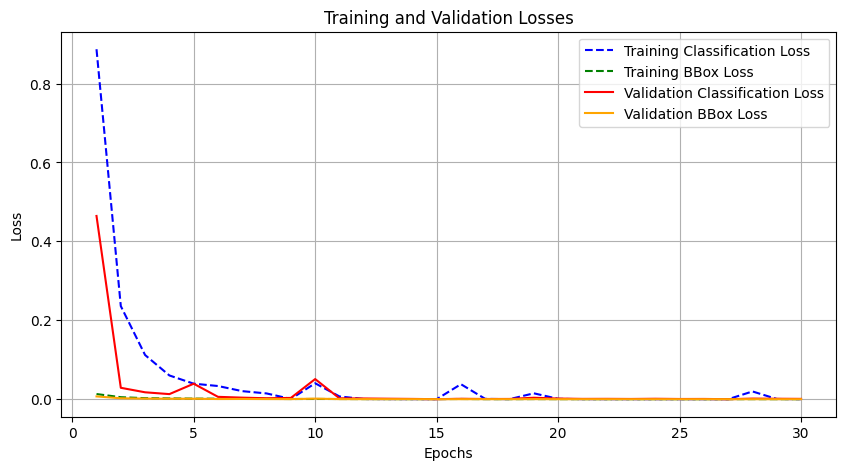

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt

# Optimizer, Loss Functions
optimizer = optim.Adam(model.parameters(), lr=1e-3)  
class_loss_fn = nn.CrossEntropyLoss()  # Classification loss
bbox_loss_fn = nn.SmoothL1Loss()  # Bounding box regression loss (Huber Loss)
def train_model(model, train_loader, val_loader, optimizer, class_loss_fn, bbox_loss_fn, num_epochs=30, patience=5, alpha=0.7):
    train_class_losses = []
    train_bbox_losses = []
    val_class_losses = []
    val_bbox_losses = []
    best_val_loss = float('inf')
    early_stop_counter = 0
    model.train()

    for epoch in range(num_epochs):
        train_class_loss = 0.0
        train_bbox_loss = 0.0
        val_class_loss = 0.0
        val_bbox_loss = 0.0
        model.train()

        # Training loop
        for images, class_labels, bbox_labels in tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{num_epochs}"):
            images = images.to(device)
            class_labels = class_labels.to(device)
            bbox_labels = bbox_labels.to(device)

            # Forward pass
            optimizer.zero_grad()
            class_preds, bbox_preds = model(images)

            # Calculate losses
            classification_loss = class_loss_fn(class_preds, class_labels)
            bbox_regression_loss = bbox_loss_fn(bbox_preds, bbox_labels) 
            
            # Apply weight to the bounding box loss
            total_loss = alpha * classification_loss + (1 - alpha) * bbox_regression_loss * 100
        
            # Backward pass and optimization
            total_loss.backward()
            optimizer.step()

            train_class_loss += classification_loss.item() * images.size(0)  # Accumulate class loss for the batch
            train_bbox_loss += bbox_regression_loss.item() * images.size(0)  # Accumulate bbox loss for the batch

        # Compute average training loss for the epoch
        train_class_loss /= len(train_loader.dataset)
        train_bbox_loss /= len(train_loader.dataset)
        train_class_losses.append(train_class_loss)
        train_bbox_losses.append(train_bbox_loss)

        # Validation loop
        model.eval()
        with torch.no_grad():
            for images, class_labels, bbox_labels in val_loader:
                images = images.to(device)
                class_labels = class_labels.to(device)
                bbox_labels = bbox_labels.to(device)

                # Forward pass
                class_preds, bbox_preds = model(images)

                # Calculate losses
                classification_loss = class_loss_fn(class_preds, class_labels)
                bbox_regression_loss = bbox_loss_fn(bbox_preds, bbox_labels)
          
                val_class_loss += classification_loss.item() * images.size(0)
                val_bbox_loss += bbox_regression_loss.item() * images.size(0)

        # Compute average validation loss for the epoch
        val_class_loss /= len(val_loader.dataset)
        val_bbox_loss /= len(val_loader.dataset)
        val_class_losses.append(val_class_loss)
        val_bbox_losses.append(val_bbox_loss)

        # Apply the weight to the validation bounding box loss and calculate total validation loss
        weighted_val_loss = alpha * val_class_loss + (1 - alpha) * val_bbox_loss * 100

        # Early Stopping Check
        if weighted_val_loss < best_val_loss:
            best_val_loss = weighted_val_loss
            early_stop_counter = 0  # Reset counter if we get an improvement
             # Save the model
            torch.save(model.state_dict(), 'best_model.pth')
            print(f'Model saved at epoch {epoch+1} with validation loss: {weighted_val_loss:.4f}')
        else:
            early_stop_counter += 1
            print(f'Early stopping counter: {early_stop_counter}/{patience}')

        # Print epoch losses
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Class Loss: {train_class_loss:.4f}, Train BBox Loss: {train_bbox_loss:.4f}, Val Class Loss: {val_class_loss:.4f}, Val BBox Loss: {val_bbox_loss:.4f}')

        # Stop training if patience is exceeded
        if early_stop_counter >= patience:
            print(f'Early stopping at epoch {epoch+1}')
            break

    return train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses

def plot_losses(train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses):
    epochs = range(1, len(train_class_losses) + 1)
    plt.figure(figsize=(10, 5))

    # Plot training losses
    plt.plot(epochs, train_class_losses, 'b', label='Training Classification Loss', linestyle='--')
    plt.plot(epochs, train_bbox_losses, 'g', label='Training BBox Loss', linestyle='--')

    # Plot validation losses
    plt.plot(epochs, val_class_losses, 'r', label='Validation Classification Loss', linestyle='-')
    plt.plot(epochs, val_bbox_losses, 'orange', label='Validation BBox Loss', linestyle='-')

    # Set plot labels and title
    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses = train_model(
    model, train_loader, val_loader, optimizer, class_loss_fn, bbox_loss_fn, num_epochs=30, patience=5)
# Save the final model after training, regardless of early stopping
torch.save(model.state_dict(), 'final_model.pth')
print('Final model saved after training completes.')

plot_losses(train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses)

### 2.3. Evaulate and do inference with the trained custom model

Choose **at least 3 metrics** to evaluate your object detection model. These could include:

- **Precision**: The proportion of correctly predicted positive instances (objects detected) out of all instances classified as positive.
- **Recall**: The proportion of correctly predicted positive instances out of all actual positive instances (objects present in the image).
- **F1-Score**: The harmonic mean of Precision and Recall, balancing false positives and false negatives.
- **IoU (Intersection over Union)**: Measures the overlap between the predicted bounding box and the ground truth bounding box.
- **mAP (mean Average Precision)**: This is one of the most common evaluation metrics for object detection. It averages precision at different recall thresholds across all object classes.
  
Additionally, you can assess:
- **Inference speed**: Time taken by the model to process a single image.
- **Number of parameters**: The total number of trainable parameters in the model.
- **Model size**: The disk size of the trained model.

### Show Performance Metric Visualizations

- Visualize the chosen metrics (e.g., **Precision, Recall, F1-Score, IoU, mAP**) over different epochs to demonstrate the improvement in the model’s performance.
- Plot losses (both classification loss and localization loss) to show how they decrease throughout training.

### Show Some Predictions of Your Trained Model

- Display sample images with **predicted bounding boxes** and compare them to the ground truth.
- Highlight the values of **Precision, Recall, IoU**, or other relevant metrics for each displayed prediction, giving a clear view of the model's performance.
  
You can also use **WandB (Weights and Biases)** or **TensorBoard** for more detailed logging and tracking of these metrics and visualizations.


In [1]:
import torch
print(torch.cuda.is_available())


True


In [4]:
import torch

# Initialize the model with the same architecture as used during training
model = CustomModel(num_classes=3).to(device)

# Load the saved weights from the training
model.load_state_dict(torch.load('final_model.pth'))  # or 'best_model.pth'

# Set the model to evaluation mode
model.eval()


/tmp/ipykernel_16828/3345742657.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('final_model.pth'))  # or 'best_model.pth'


CustomModel(
  (backbone): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tru

In [9]:
import torch
import numpy as np

# Helper function to compute IoU between two bounding boxes
def calculate_iou(box1, box2):
    # Convert [x_center, y_center, width, height] to [x_min, y_min, x_max, y_max]
    box1_x1 = box1[0] - box1[2] / 2
    box1_y1 = box1[1] - box1[3] / 2
    box1_x2 = box1[0] + box1[2] / 2
    box1_y2 = box1[1] + box1[3] / 2

    box2_x1 = box2[0] - box2[2] / 2
    box2_y1 = box2[1] - box2[3] / 2
    box2_x2 = box2[0] + box2[2] / 2
    box2_y2 = box2[1] + box2[3] / 2

    # Compute the area of intersection
    inter_x1 = max(box1_x1, box2_x1)
    inter_y1 = max(box1_y1, box2_y1)
    inter_x2 = min(box1_x2, box2_x2)
    inter_y2 = min(box1_y2, box2_y2)
    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)

    # Compute the area of both the predicted box and the ground truth box
    box1_area = (box1_x2 - box1_x1) * (box1_y2 - box1_y1)
    box2_area = (box2_x2 - box2_x1) * (box2_y2 - box2_y1)

    # Compute the intersection over union (IoU)
    iou = inter_area / (box1_area + box2_area - inter_area + 1e-6)
    return iou



In [15]:
import torch
import torchmetrics
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from sklearn.metrics import confusion_matrix
import numpy as np

def convert_bbox_format(bbox):
    """Converts (x_center, y_center, width, height) to (x_min, y_min, x_max, y_max)."""
    x_center, y_center, width, height = bbox
    x_min = x_center - width / 2
    y_min = y_center - height / 2
    x_max = x_center + width / 2
    y_max = y_center + height / 2
    return [x_min, y_min, x_max, y_max]

# Function to evaluate the model and calculate precision, recall, IoU, confusion matrix, and mAP
def evaluate_model_with_metrics(model, data_loader, iou_threshold=0.5, num_classes=3):
    model.eval()
    all_class_labels = []
    all_class_preds = []
    all_bbox_labels = []
    all_bbox_preds = []
    ious = []

    # Initialize mAP, precision, and recall metrics using torchmetrics and move them to the appropriate device
    mAP_metric = MeanAveragePrecision(iou_thresholds=[0.5]).to(device)
    precision_metric = torchmetrics.Precision(task="multiclass", num_classes=num_classes, average='macro').to(device)
    recall_metric = torchmetrics.Recall(task="multiclass", num_classes=num_classes, average='macro').to(device)

    for images, class_labels, bbox_labels in data_loader:
        images = images.to(device)
        class_labels = class_labels.to(device)
        bbox_labels = bbox_labels.to(device)

        with torch.no_grad():
            class_preds, bbox_preds = model(images)
            class_preds = torch.argmax(class_preds, dim=1)

            all_class_labels.append(class_labels.cpu().numpy())
            all_class_preds.append(class_preds.cpu().numpy())

            all_bbox_labels.append(bbox_labels.cpu().numpy())
            all_bbox_preds.append(bbox_preds.cpu().numpy())

            # Update mAP metric with predictions and labels
            for i in range(len(bbox_preds)):
                # Convert from (x_center, y_center, w, h) to (x_min, y_min, x_max, y_max)
                pred_box = convert_bbox_format(bbox_preds[i].cpu().numpy())
                target_box = convert_bbox_format(bbox_labels[i].cpu().numpy())

                # Extract confidence score from the model's predictions (assuming sigmoid for bbox output)
                confidence_score = torch.sigmoid(class_preds[i].float()).max().item()

                preds = [{
                    'boxes': torch.tensor([pred_box]),
                    'scores': torch.tensor([confidence_score]),
                    'labels': class_preds[i].unsqueeze(0).cpu()
                }]
                targets = [{
                    'boxes': torch.tensor([target_box]),
                    'labels': class_labels[i].unsqueeze(0).cpu()
                }]
                mAP_metric.update(preds, targets)

            # Update precision and recall metrics
            precision_metric.update(class_preds, class_labels)
            recall_metric.update(class_preds, class_labels)

            # Calculate IoU for the current batch
            for bbox_pred, bbox_label in zip(bbox_preds, bbox_labels):
                pred_box = convert_bbox_format(bbox_pred.cpu().numpy())
                target_box = convert_bbox_format(bbox_label.cpu().numpy())
                iou = calculate_iou(pred_box, target_box)
                ious.append(iou)

    # Calculate confusion matrix
    all_class_labels = np.concatenate(all_class_labels)
    all_class_preds = np.concatenate(all_class_preds)
    conf_matrix = confusion_matrix(all_class_labels, all_class_preds)

    # Compute the mAP from the accumulated data
    mAP_result = mAP_metric.compute()

    # Compute precision and recall
    precision = precision_metric.compute()
    recall = recall_metric.compute()

    # Calculate mean IoU
    mean_iou = np.mean([ious])

    return precision, recall, conf_matrix, mAP_result, mean_iou

# Load the model, data, and compute metrics
precision, recall, conf_matrix, mAP_result, mean_iou = evaluate_model_with_metrics(model, test_loader)

# Print the evaluation results
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"mAP: {mAP_result['map']:.4f}")



Precision: 1.0000
Recall: 1.0000
Confusion Matrix:
[[65  0  0]
 [ 0 68  0]
 [ 0  0 67]]
mAP: 0.9414


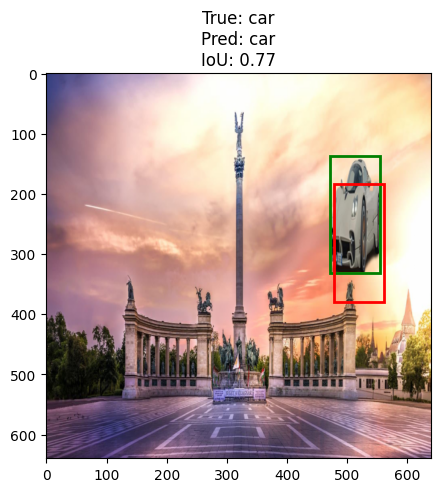

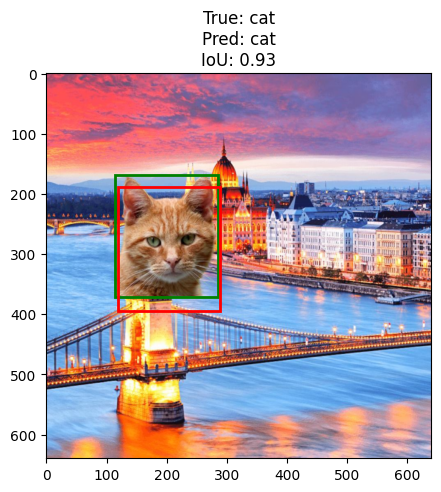

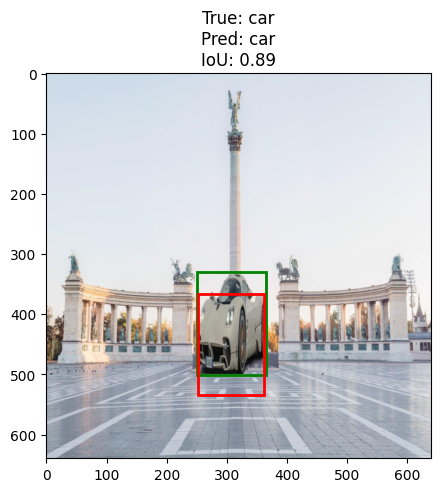

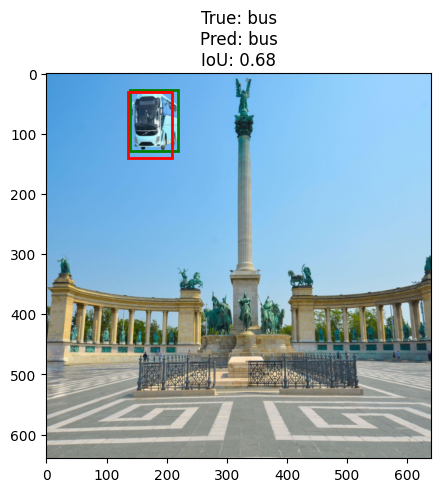

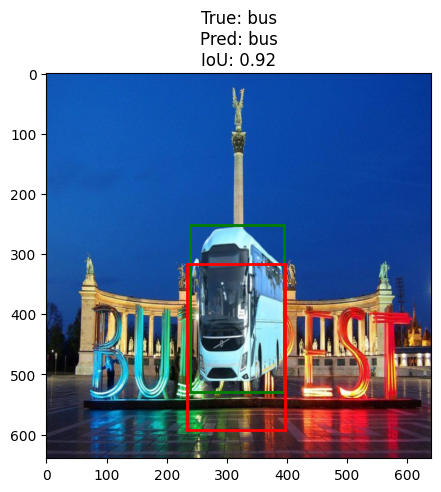

...

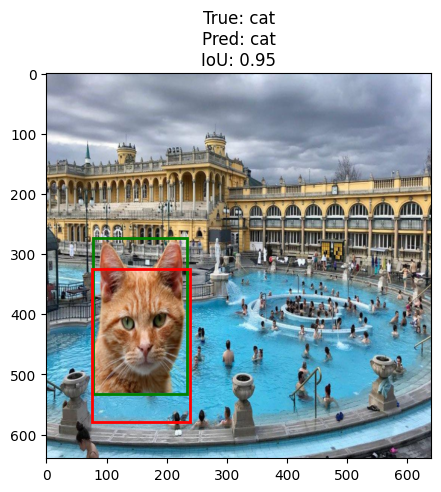

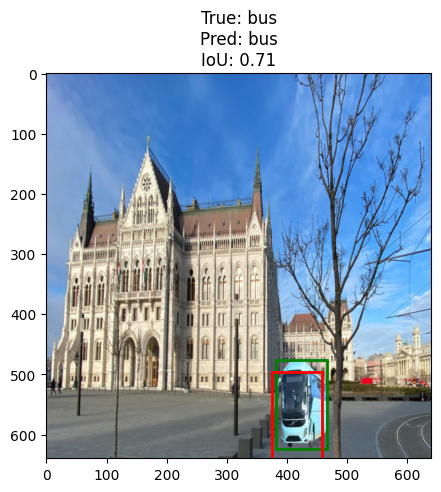

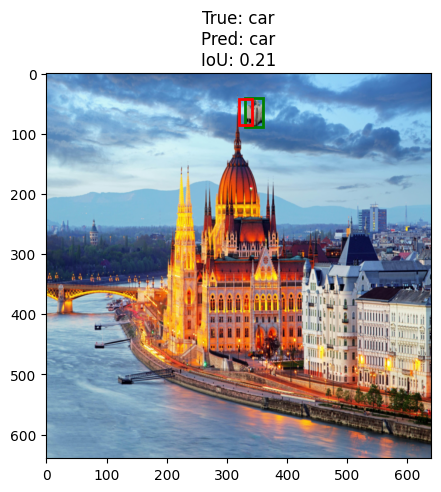

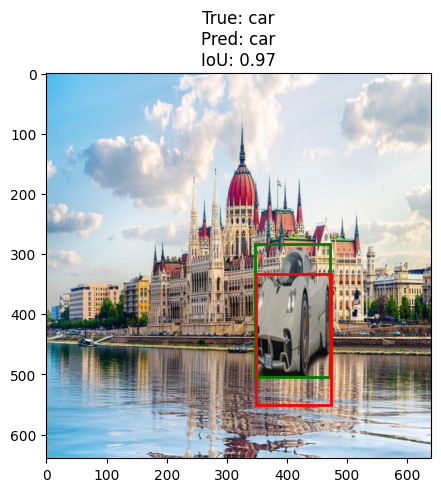

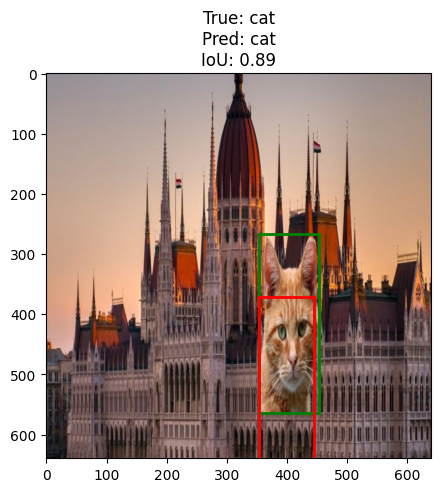

In [11]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import torch

# Helper function to plot bounding boxes and metrics on an image, one by one
def show_predictions_one_by_one(model, dataset, num_images=30):
    model.eval()  # Set model to evaluation mode

    for i in range(num_images):
        # Get a random image and its ground truth from the dataset
        image, true_class, true_bbox = dataset[i]
        image = image.unsqueeze(0).to(device)  # Add batch dimension and send to device
        true_class = true_class.item()
        true_bbox = true_bbox.cpu().numpy()

        # Get model predictions
        with torch.no_grad():
            class_preds, bbox_preds = model(image)
            predicted_class = torch.argmax(class_preds, dim=1).cpu().numpy()[0]
            predicted_bbox = bbox_preds.cpu().numpy()[0]

        # Convert the image tensor to numpy for visualization
        image_np = image.squeeze().cpu().permute(1, 2, 0).numpy()  # Remove batch dimension and convert to HWC

        # Calculate IoU
        iou = calculate_iou(predicted_bbox, true_bbox)

        # Plot the image
        plt.figure(figsize=(10, 5))
        plt.imshow(image_np)

        # Ground truth bounding box
        img_height, img_width = image_np.shape[:2]
        x_center, y_center, box_width, box_height = true_bbox
        x1_true = (x_center - box_width / 2) * img_width
        y1_true = (y_center - box_height / 2) * img_height
        rect_true = patches.Rectangle((x1_true, y1_true), box_width * img_width, box_height * img_height,
                                      linewidth=2, edgecolor='green', facecolor='none', label="Ground Truth")
        plt.gca().add_patch(rect_true)

        # Predicted bounding box
        x_center_pred, y_center_pred, box_width_pred, box_height_pred = predicted_bbox
        x1_pred = (x_center_pred - box_width_pred / 2) * img_width
        y1_pred = (y_center_pred - box_width_pred / 2) * img_height
        rect_pred = patches.Rectangle((x1_pred, y1_pred), box_width_pred * img_width, box_height_pred * img_height,
                                      linewidth=2, edgecolor='red', facecolor='none', label="Prediction")
        plt.gca().add_patch(rect_pred)

        plt.title(f"True: {classes[true_class]}\nPred: {classes[predicted_class]}\nIoU: {iou:.2f}")

        plt.show()

# Display predictions for test images one by one
show_predictions_one_by_one(model, test_dataset, num_images=30)


### 2.4. Load an Existing Object Detection Model

We recommend using the latest **YOLO** version, but you are free to choose any other **PyTorch-based** object detection model.


### 2.5. Fine-tune the existing object detection model
If you choose to use **YOLO**, training the model can be done easily by providing a `data.yaml` file (which follows a specific format, check the official GitHub repository for details) and running the training script.

For example, you can run YOLO from the command line with:

```bash
!yolo task=detect mode=train data=datasets/data.yaml model=yolov8n.yaml epochs=200 imgsz=640
```

Make sure to show the losses and metrics visualizations. By default, YOLO should **verbose** those.

In [1]:
!yolo task=detect mode=train data=dataset/data.yaml model=yolov8n.yaml epochs=30 imgsz=640

New https://pypi.org/project/ultralytics/8.3.18 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.17 🚀 Python-3.10.15 torch-2.5.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 3902MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=dataset/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show

### 2.6 Evaluate the existing object detection model
**Compare the performance** of your custom model and the YOLO model, ensuring both are evaluated on the **same subset of images** using the **same metrics** chosen in **Step 2.3** (e.g., Precision, Recall, F1-Score, IoU, mAP).


In [5]:
from ultralytics import YOLO

# Load the trained model
model = YOLO('runs/detect/train8/weights/best.pt')  # Path to your trained model

# Perform validation (this will evaluate on the validation set)
metrics = model.val()



Ultralytics 8.3.17 🚀 Python-3.10.15 torch-2.5.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 3902MiB)
YOLOv8n summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/train/labels.cache... 5000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:25<00:00, 12.46it/s]


                   all       5000       5000          1          1      0.995      0.994
                   bus       1674       1674          1          1      0.995      0.994
                   car       1701       1701          1          1      0.995      0.994
                   cat       1625       1625          1          1      0.995      0.994
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/val10



image 1/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00000.jpg: 288x640 1 car, 43.4ms
image 2/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00001.jpg: 544x640 1 cat, 37.3ms
image 3/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00002.jpg: 448x640 1 car, 35.4ms
image 4/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00003.jpg: 512x640 1 bus, 34.7ms
image 5/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00004.jpg: 384x640 1 bus, 35.3ms
image 6/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00005.jpg: 448x640 1 cat, 6.7ms
image 7/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00006.jpg: 448x640 1 car, 5.0ms
image 8/200 /home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images/00007.jpg: 448x640 1 cat, 6.2ms
image 9/200 /home/sazid/Documents/semester

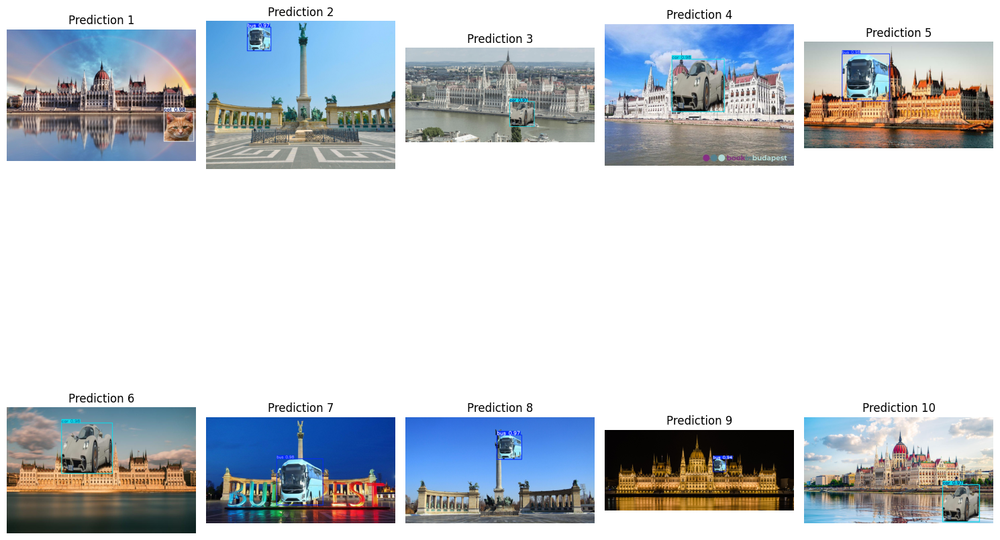

In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os
import random
from PIL import Image
import cv2 

# Load trained model
model = YOLO('runs/detect/train8/weights/best.pt')

# Path to save the predictions
save_dir = 'path/to/save/folder'

# Ensure the directory exists
os.makedirs(save_dir, exist_ok=True)

# Run inference on the test dataset
results = model('/home/sazid/Documents/semester3/DND ass/dataset/custom_dataset/test/images')  # Run on all test images

# Select 10 random images
num_images = min(10, len(results))  # Ensure I don't select more images than available
random_indices = random.sample(range(len(results)), num_images)

# Set up Matplotlib to display images
plt.figure(figsize=(15, 15))

for i, idx in enumerate(random_indices):
    result = results[idx]
    
    # Use result.plot() to get the annotated image with predictions
    annotated_img = result.plot()  # This gives me the image in BGR format
    
    # Convert BGR to RGB for proper color display in Matplotlib
    annotated_img_rgb = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
    
    # Display the image in Matplotlib
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns for 10 images
    plt.imshow(annotated_img_rgb)  # Show the image in RGB
    plt.axis('off')  # Hide axis labels
    plt.title(f'Prediction {i+1}')

plt.tight_layout()
plt.show()

# 3. COMPARISON
**Compare the performance** of your custom model and the YOLO model, ensuring both are evaluated on the **same subset of images** for a fair comparison. Key metrics to include:

- **Precision**: Both custom and YOLO models achieve perfect precision and recall scores (1.00).
- **Recall**: Both custom and YOLO models achieve perfect precision and recall scores (1.00).
- **Mean Average Precision (mAP)**: The custom model has an mAP of 94.14%, whereas the YOLO model achieves a higher mAP of 99.5%.

### Explain Differences

- Discuss why one model may perform better than the other, considering architecture, dataset complexity, or fine-tuning.
#### Reasons for Differences:

1. **Backbone Complexity**:
   - Custom Model: The custom model has a deeper and more complex regression head, but the additional layers may not necessarily lead to better accuracy in bounding box predictions. While the model did not suffer from overfitting, its increased complexity could make it harder for the model to converge optimally during training. This complexity might prevent the model from fully capturing the spatial features necessary for precise bounding box regression, leading to its slightly lower mean Average Precision (mAP) score.

    - YOLO: In contrast, YOLO's bounding box regression has been optimized through extensive fine-tuning on large-scale datasets. It excels in predicting bounding boxes accurately due to its streamlined architecture and highly effective parameterization for bounding box locations. YOLO’s bounding box loss functions are carefully tuned for this task, giving it an edge over the custom model.
2. **Bounding Box Regressor**:
   - Custom Model: The custom model's optimization process might not be as refined as YOLO’s. Factors such as the choice of learning rate, regularization techniques, and loss functions can significantly impact performance. While the model is not overfitting, it may require more fine-tuning of these hyperparameters to converge more efficiently during training. The SmoothL1 loss function for bounding box regression, while useful, might not be as effective as more advanced methods like IoU loss in predicting bounding boxes with high precision.

    - YOLO:  YOLO’s bounding box regressor is highly efficient due to extensive research and fine-tuning. It leverages advanced loss functions like IoU loss, which directly optimizes the intersection over union of predicted and ground-truth boxes, resulting in more accurate localization. Additionally, YOLO’s training schedule, learning rate, and regularization have been carefully optimized for large-scale object detection tasks, giving it a significant advantage in performance.
3. **Pre-training**:
   - YOLO models benefit from large-scale pre-training, which provides an edge in feature extraction and bounding box prediction.
   - The custom model, built from scratch, doesn't have the benefit of such pre-training, leading to slightly worse mAP performance.

### Improve Custom Model

- Suggest improvements such as better data augmentation, model architecture adjustments, hyperparameter tuning, or more training data.
- Explore **Transfer Learning**, **learning rate scheduling**, or new optimizers for better performance.


#### Improvements for Custom Model:
To improve your custom object detection model, adding **data augmentation** techniques like random rotations, scaling, and color jitter to increase diversity and improve generalization. Adjust the **model architecture** by incorporating **Feature Pyramid Networks (FPNs)** for multi-scale detection and using **depthwise separable convolutions** to reduce computational cost. Additionally, fine-tune the **hyperparameters**, using techniques like **learning rate scheduling** (for example, cosine annealing) to improve training convergence. Implementing **Transfer Learning** with a pretrained backbone can also significantly boost performance without training from scratch. Lastly, switching to advanced optimizers like **AdamW** or **Ranger** can help stabilize training and lead to faster convergence.

## Visualize Predictions

- Show predictions from both models on the same images.
- Include bounding boxes, class labels, and relevant metrics like IoU or Precision.


In [5]:
from torch.utils.data import DataLoader
from torchvision import transforms

# ObjectDetectionDataset class is already defined
transform = transforms.Compose([
    transforms.Resize((640, 640)),  # Resize all images to 640x640
    transforms.ToTensor(),  # Convert image to tensor
])

# Path to the test dataset
root_dir = 'dataset/custom_dataset'  

# Load the test dataset
test_dataset = ObjectDetectionDataset(root_dir=root_dir, split='test', transform=transform)

# Create a DataLoader for the test dataset
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=4, pin_memory=True)


In [6]:
import torch
from ultralytics import YOLO

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the custom model
custom_model = CustomModel(num_classes=3).to(device)
custom_model.load_state_dict(torch.load('final_model.pth'))  # Path to saved weights
custom_model.eval()  # Set to evaluation mode
print("Custom model loaded successfully!")

# Load the YOLO model
yolo_model = YOLO('runs/detect/train8/weights/best.pt')  # Path to YOLOv8 weights
print("YOLO model loaded successfully!")


Custom model loaded successfully!
YOLO model loaded successfully!



image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 2 cats, 6.0ms
Speed: 10.9ms preprocess, 6.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


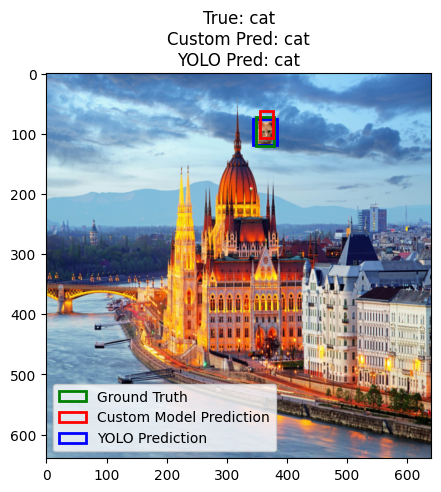


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 cat, 7.0ms
Speed: 1.1ms preprocess, 7.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


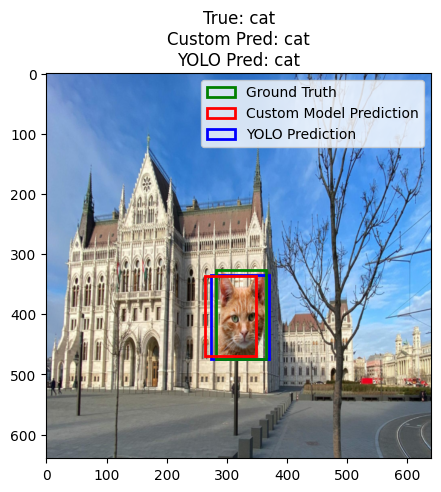


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 bus, 5.2ms
Speed: 1.7ms preprocess, 5.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


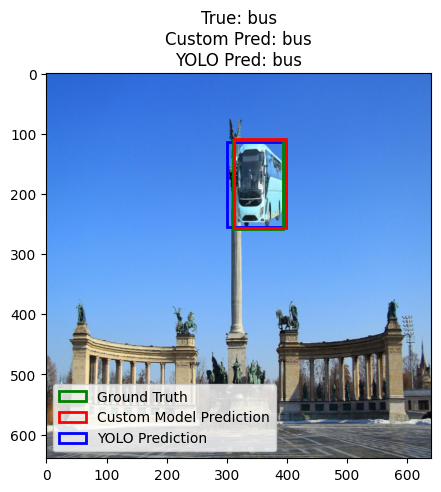


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 bus, 6.3ms
Speed: 1.2ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


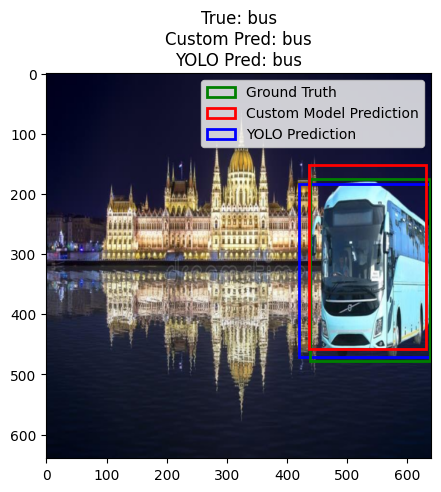


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 bus, 6.5ms
Speed: 1.2ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


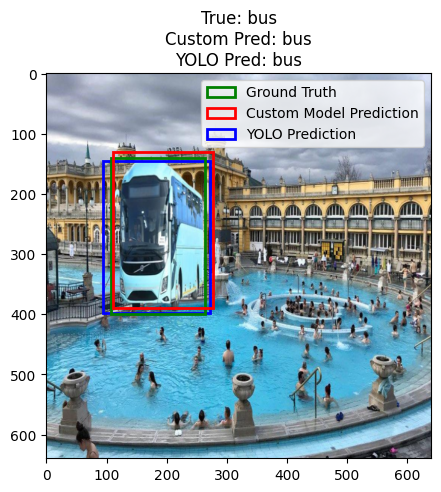


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 bus, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


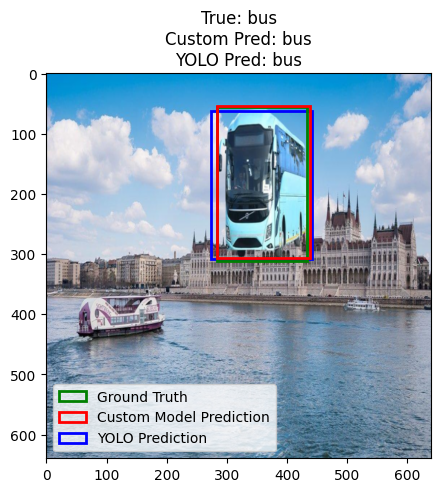


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 cat, 5.8ms
Speed: 1.5ms preprocess, 5.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


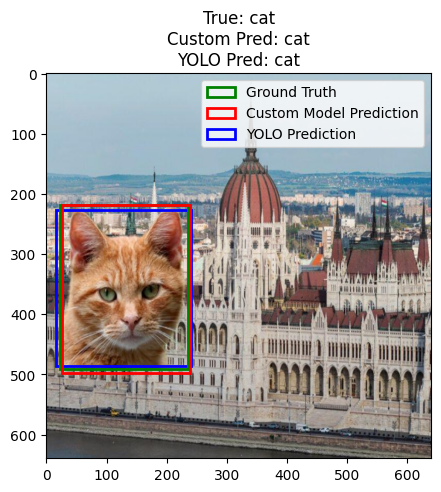


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 cat, 5.6ms
Speed: 1.2ms preprocess, 5.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


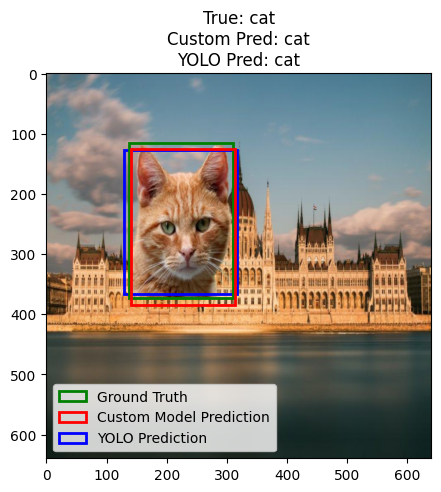


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 bus, 5.7ms
Speed: 1.8ms preprocess, 5.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


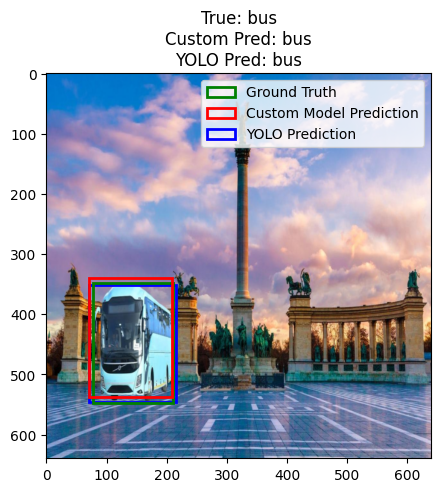


image 1/1 /home/sazid/Documents/semester3/DND ass/temp_image.jpg: 640x640 1 car, 6.8ms
Speed: 1.6ms preprocess, 6.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


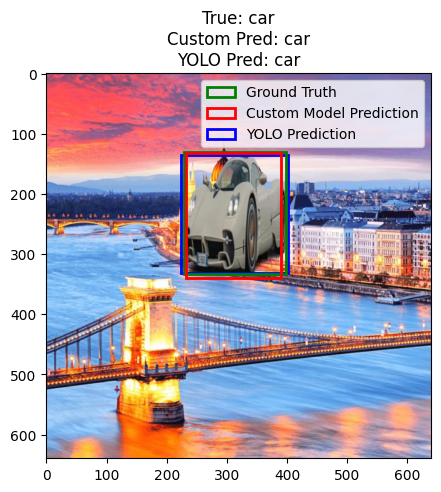

In [12]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import cv2
import torch
import random

classes = ['bus', 'car', 'cat']  # Class names corresponding to indices 0, 1, 2

# Helper function to calculate IoU between two bounding boxes
def calculate_iou(box1, box2):
    box1_x1 = box1[0] - box1[2] / 2
    box1_y1 = box1[1] - box1[3] / 2
    box1_x2 = box1[0] + box1[2] / 2
    box1_y2 = box1[1] + box1[3] / 2

    box2_x1 = box2[0] - box2[2] / 2
    box2_y1 = box2[1] - box2[3] / 2
    box2_x2 = box2[0] + box2[2] / 2
    box2_y2 = box2[1] + box2[3] / 2

    inter_x1 = max(box1_x1, box2_x1)
    inter_y1 = max(box1_y1, box2_y1)
    inter_x2 = min(box1_x2, box2_x2)
    inter_y2 = min(box1_y2, box2_y2)
    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)

    box1_area = (box1_x2 - box1_x1) * (box1_y2 - box1_y1)
    box2_area = (box2_x2 - box2_x1) * (box2_y2 - box2_y1)

    iou = inter_area / (box1_area + box2_area - inter_area + 1e-6)
    return iou

# Function to visualize predictions from both models
def visualize_predictions(custom_model, yolo_model, dataset, num_images=10):
    custom_model.eval()  # Set model to evaluation mode
    
    # Randomly select a few test images
    random_indices = random.sample(range(len(dataset)), num_images)
    
    for idx in random_indices:
        # Get a test image and its ground truth
        image, true_class, true_bbox = dataset[idx]
        image_np = image.permute(1, 2, 0).cpu().numpy()  # Convert tensor to numpy for displaying
        
        # Resize image to 640x640 for YOLO inference 
        resized_image = Image.fromarray((image_np * 255).astype('uint8')).resize((640, 640))
        
        # Save the resized image temporarily for YOLO inference
        temp_img_path = "temp_image.jpg"
        resized_image.save(temp_img_path)
        
        # Get predictions from the YOLO model
        yolo_result = yolo_model(temp_img_path)

        # Remove temporary image after use
        os.remove(temp_img_path)

        # Check if YOLO detected anything
        if len(yolo_result[0].boxes) == 0:
            print(f"No objects detected by YOLO in image {dataset.image_filenames[idx]}")
            continue  # Skip to the next image if nothing was detected

        # YOLO bounding box in (x_min, y_min, x_max, y_max)
        yolo_pred_bbox = yolo_result[0].boxes.xyxy[0].cpu().numpy()
        yolo_pred_class = int(yolo_result[0].boxes.cls[0])

        # Custom model prediction
        image = image.unsqueeze(0).to(device)  # Add batch dimension for custom model
        with torch.no_grad():
            custom_class_preds, custom_bbox_preds = custom_model(image)
            custom_pred_class = torch.argmax(custom_class_preds, dim=1).cpu().numpy()[0]
            custom_pred_bbox = custom_bbox_preds.cpu().numpy()[0]

        # Plot the image with bounding boxes
        plt.figure(figsize=(10, 5))
        plt.imshow(image_np)

        # Plot YOLO bounding box
        x_min, y_min, x_max, y_max = yolo_pred_bbox
        rect_yolo = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                      linewidth=2, edgecolor='blue', facecolor='none', label="YOLO Prediction")
        plt.gca().add_patch(rect_yolo)

        # Ground truth bounding box
        img_height, img_width = image_np.shape[:2]
        x_center, y_center, box_width, box_height = true_bbox
        x1_true = (x_center - box_width / 2) * img_width
        y1_true = (y_center - box_height / 2) * img_height
        rect_true = patches.Rectangle((x1_true, y1_true), box_width * img_width, box_height * img_height,
                                      linewidth=2, edgecolor='green', facecolor='none', label="Ground Truth")
        plt.gca().add_patch(rect_true)

        # Plot custom model bounding box
        x_center_pred, y_center_pred, box_width_pred, box_height_pred = custom_pred_bbox
        x1_custom = (x_center_pred - box_width_pred / 2) * img_width
        y1_custom = (y_center_pred - box_height_pred / 2) * img_height
        rect_custom = patches.Rectangle((x1_custom, y1_custom), box_width_pred * img_width, box_height_pred * img_height,
                                        linewidth=2, edgecolor='red', facecolor='none', label="Custom Model Prediction")
        plt.gca().add_patch(rect_custom)

        # Add title with relevant information
        plt.title(f"True: {classes[true_class]}\n"
                  f"Custom Pred: {classes[custom_pred_class]}\n"
                  f"YOLO Pred: {classes[yolo_pred_class]}")
        plt.legend(handles=[rect_true, rect_custom, rect_yolo])

        plt.show()

# Visualize predictions for both models on 10 test images
visualize_predictions(custom_model, yolo_model, test_dataset, num_images=10)